In [1]:
import time

import numpy as np
import pandas as pd

from os import makedirs
from shutil import make_archive

from os.path import exists

from joblib import Parallel, delayed
from utils import plot_listen_examples

import contextlib
import joblib
from tqdm import tqdm

from maad import sound
from librosa import load

In [19]:
def detect_group_leakage(df, group_name, split_name):
    
    df_overlapping = df.groupby([group_name])[split_name].nunique()
    return any(df_overlapping>1)

In [20]:
@contextlib.contextmanager
def tqdm_joblib(tqdm_object):
    """Context manager to patch joblib to report into tqdm progress bar given as argument"""
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_batch_callback = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_batch_callback
        tqdm_object.close()

In [2]:
df_anuraset_metadata = pd.read_csv('data/datasets/anurasetv3/metadata.csv')

In [3]:
df_anuraset_metadata.head()

,sample_name,fname,min_t,max_t,site,date,species_number,subset,SPHSUR,BOABIS,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0


In [23]:
df_anuraset_metadata['species_number'] = df_anuraset_metadata[df_anuraset_metadata.columns[5:-1]].sum(axis=1)

/tmp/ipykernel_10892/3208953518.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df_anuraset_metadata['species_number'] = df_anuraset_metadata[df_anuraset_metadata.columns[5:-1]].sum(axis=1)


In [24]:
df_anuraset_metadata[['site','date']] = df_anuraset_metadata['fname'].str.split('_',1,expand=True)

df_anuraset_metadata['date'] = df_anuraset_metadata['date'].str.split('_').apply(lambda x: x[0]+x[1])
df_anuraset_metadata['date'] = pd.to_datetime(df_anuraset_metadata['date'])

In [25]:
columns_S = ['sample_name', 'fname', 'min_t', 'max_t', 'site', 'date' ,
             'species_number', 'subset', 
             'SPHSUR', 'BOABIS',
       'SCIPER', 'DENNAH', 'LEPLAT', 'RHIICT', 'BOALEP', 'BOAFAB', 'PHYCUV',
       'DENMIN', 'ELABIC', 'BOAPRA', 'DENCRU', 'BOALUN', 'BOAALB', 'PHYMAR',
       'PITAZU', 'PHYSAU', 'LEPFUS', 'DENNAN', 'PHYALB', 'LEPLAB', 'SCIFUS',
       'BOARAN', 'SCIFUV', 'AMEPIC', 'LEPPOD', 'ADEDIP', 'ELAMAT', 'PHYNAT',
       'LEPELE', 'RHISCI', 'SCINAS', 'LEPNOT', 'ADEMAR', 'BOAALM', 'PHYDIS',
       'RHIORN', 'LEPFLA', 'SCIRIZ', 'DENELE', 'SCIALT',]

In [26]:
df_anuraset_metadata = df_anuraset_metadata[columns_S]

In [27]:
df_anuraset_metadata.head()

,sample_name,fname,min_t,max_t,site,date,species_number,subset,SPHSUR,BOABIS,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0


In [28]:
import shutil

# absolute path
src_path = "data/datasets/audio"
mypath = "data/datasets/anurasetv3"
#shutil.move(src_path, dst_path)

In [29]:
from os import listdir
from os.path import isfile, join

mypath = "data/datasets/anurasetv3/audio"

onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
len(onlyfiles)

93380

In [30]:
import shutil
mypath = "data/datasets"

#shutil.make_archive('anurasetv3', 'zip', mypath)

In [31]:
df_anuraset_metadata.to_csv('data/datasets/anurasetv3/metadata.csv',index=False)

In [32]:
df_anuraset_metadata.shape

(93378, 50)

In [33]:
prefix = 'SAMPLE_'
dataset_size = df_anuraset_metadata.shape[0]
exponent_of_10 = int(np.ceil(np.log10(dataset_size)))
sample_names = prefix + df_anuraset_metadata.index.astype(str).str.zfill(exponent_of_10)  + '.wav'
df_anuraset_metadata.insert(loc=0,column='sample_name',value=sample_names)

ValueError: cannot insert sample_name, already exists

In [34]:
df_anuraset_metadata.head()

,sample_name,fname,min_t,max_t,site,date,species_number,subset,SPHSUR,BOABIS,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_anuraset_metadata.shape

(93496, 46)

In [ ]:
"""
# create folder
path_save_audio = path_save + dataset_name

if not exists(path_save_audio):
    makedirs(path_save_audio)
    print('Folder created:', path_save_audio)
    """

"\n# create folder\npath_save_audio = path_save + dataset_name\n\nif not exists(path_save_audio):\n    makedirs(path_save_audio)\n    print('Folder created:', path_save_audio)\n    "

In [ ]:
def preprocessing_audio(sample_name, 
                        fname, 
                        min_t, 
                        max_t,
                        dataset_name = 'dataset_',
                        target_sr = 22050,
                        flims = (1,10000),
                        path_save = 'data/datasets/',
                        raw_audio_dir = 'data/raw/audio/',
                        save_audio=True
                        ):            
        
        try:
            path_save_audio = path_save + dataset_name
            if not exists(path_save_audio):
                makedirs(path_save_audio)
                print('Folder created:', path_save_audio)

            # asumption: folder name = first element of fname after splitting by _     
            folder_name = fname.split('_')[0] + '/'
            raw_audio_file = raw_audio_dir + folder_name + fname + '.wav'

            duration = max_t-min_t

            s, fs = load(raw_audio_file, offset=min_t, duration=duration)
            s_resampled = sound.resample(s, fs, target_sr)
            s_filtered = sound.select_bandwidth(s_resampled,
                                                target_sr,
                                                fcut=flims, 
                                                forder=5, fname ='butter', ftype='bandpass')
            s_normalized = sound.normalize(s_filtered, 
                                           max_amp=0.7)

            if save_audio:
                fname_save = os.path.join(path_save_audio, sample_name)
                sound.write(fname_save, target_sr, s_normalized, bit_depth=16)
        except Exception as e: 
                #print(e,sample_name, fname, min_t, max_t)
                return e,sample_name, fname, min_t, max_t


In [ ]:
preprocessing_audio(sample_name=df_anuraset_metadata['sample_name'][0], 
                        fname=df_anuraset_metadata['fname'][0], 
                        min_t=df_anuraset_metadata['min_t'][0], 
                        max_t=df_anuraset_metadata['max_t'][0],
                   save_audio=False)


#
#readme_generator(df_dataset_cv,name=path_save,sr=target_sr,wl=wl,flims=flims)

In [ ]:
"""
for i, row in tqdm(df_anuraset_metadata.iterrows(), total=len(df_anuraset_metadata)):
    preprocessing_audio(sample_name=row['sample_name'], 
                        fname=row['fname'], 
                        min_t=row['min_t'], 
                        max_ t=row['max_t'],
                        save_audio=False)
                        """

"\nfor i, row in tqdm(df_anuraset_metadata.iterrows(), total=len(df_anuraset_metadata)):\n    preprocessing_audio(sample_name=row['sample_name'], \n                        fname=row['fname'], \n                        min_t=row['min_t'], \n                        max_ t=row['max_t'],\n                        save_audio=False)\n                        "

In [ ]:
with tqdm_joblib(tqdm(total=len(df_anuraset_metadata))) as progress_bar:
    result = Parallel(n_jobs=5)(delayed(preprocessing_audio)(row[0],row[1], row[2], row[3]) 
                  for row in df_anuraset_metadata[['sample_name','fname', 'min_t', 'max_t']].to_numpy())

100%|██████████| 93496/93496 [58:47<00:00, 26.51it/s]  


In [ ]:
errors = [i for i in result if i]

In [ ]:
df_errors = pd.DataFrame(errors, columns=['Errors','sample_name', 'fname', 'min', 'max'])
df_errors['fname'].unique()

array(['INCT20955_20191107_000000', 'INCT20955_20191107_010000',
       'INCT20955_20191111_174500', 'INCT20955_20191111_181500',
       'INCT20955_20191111_204500', 'INCT20955_20191123_040000'],
      dtype=object)

In [ ]:
# check how many of these are in the data?
df_errors['sample_name'].unique()

array(['SAMPLE_07465.wav', 'SAMPLE_07466.wav', 'SAMPLE_07467.wav',
       'SAMPLE_07468.wav', 'SAMPLE_07469.wav', 'SAMPLE_07470.wav',
       'SAMPLE_07471.wav', 'SAMPLE_07472.wav', 'SAMPLE_07473.wav',
       'SAMPLE_07474.wav', 'SAMPLE_07475.wav', 'SAMPLE_07476.wav',
       'SAMPLE_07477.wav', 'SAMPLE_07478.wav', 'SAMPLE_07479.wav',
       'SAMPLE_07480.wav', 'SAMPLE_07481.wav', 'SAMPLE_07510.wav',
       'SAMPLE_07511.wav', 'SAMPLE_07512.wav', 'SAMPLE_07513.wav',
       'SAMPLE_07514.wav', 'SAMPLE_07515.wav', 'SAMPLE_07516.wav',
       'SAMPLE_07517.wav', 'SAMPLE_07518.wav', 'SAMPLE_07519.wav',
       'SAMPLE_07520.wav', 'SAMPLE_07521.wav', 'SAMPLE_07522.wav',
       'SAMPLE_07523.wav', 'SAMPLE_07524.wav', 'SAMPLE_07525.wav',
       'SAMPLE_07526.wav', 'SAMPLE_07527.wav', 'SAMPLE_07528.wav',
       'SAMPLE_07529.wav', 'SAMPLE_07530.wav', 'SAMPLE_07531.wav',
       'SAMPLE_07532.wav', 'SAMPLE_07533.wav', 'SAMPLE_07534.wav',
       'SAMPLE_07535.wav', 'SAMPLE_07536.wav', 'SAMPLE_07537.w

In [ ]:
filename_errors = ['INCT20955_20191107_000000', 'INCT20955_20191107_010000',
       'INCT20955_20191111_174500', 'INCT20955_20191111_181500',
       'INCT20955_20191111_204500', 'INCT20955_20191123_040000']

sample_errors = ['SAMPLE_07465.wav', 'SAMPLE_07466.wav', 'SAMPLE_07467.wav',
       'SAMPLE_07468.wav', 'SAMPLE_07469.wav', 'SAMPLE_07470.wav',
       'SAMPLE_07471.wav', 'SAMPLE_07472.wav', 'SAMPLE_07473.wav',
       'SAMPLE_07474.wav', 'SAMPLE_07475.wav', 'SAMPLE_07476.wav',
       'SAMPLE_07477.wav', 'SAMPLE_07478.wav', 'SAMPLE_07479.wav',
       'SAMPLE_07480.wav', 'SAMPLE_07481.wav', 'SAMPLE_07510.wav',
       'SAMPLE_07511.wav', 'SAMPLE_07512.wav', 'SAMPLE_07513.wav',
       'SAMPLE_07514.wav', 'SAMPLE_07515.wav', 'SAMPLE_07516.wav',
       'SAMPLE_07517.wav', 'SAMPLE_07518.wav', 'SAMPLE_07519.wav',
       'SAMPLE_07520.wav', 'SAMPLE_07521.wav', 'SAMPLE_07522.wav',
       'SAMPLE_07523.wav', 'SAMPLE_07524.wav', 'SAMPLE_07525.wav',
       'SAMPLE_07526.wav', 'SAMPLE_07527.wav', 'SAMPLE_07528.wav',
       'SAMPLE_07529.wav', 'SAMPLE_07530.wav', 'SAMPLE_07531.wav',
       'SAMPLE_07532.wav', 'SAMPLE_07533.wav', 'SAMPLE_07534.wav',
       'SAMPLE_07535.wav', 'SAMPLE_07536.wav', 'SAMPLE_07537.wav',
       'SAMPLE_07538.wav', 'SAMPLE_07539.wav', 'SAMPLE_08577.wav',
       'SAMPLE_08578.wav', 'SAMPLE_08579.wav', 'SAMPLE_08580.wav',
       'SAMPLE_08581.wav', 'SAMPLE_08582.wav', 'SAMPLE_08583.wav',
       'SAMPLE_08626.wav', 'SAMPLE_08627.wav', 'SAMPLE_08628.wav',
       'SAMPLE_08629.wav', 'SAMPLE_08630.wav', 'SAMPLE_08631.wav',
       'SAMPLE_08632.wav', 'SAMPLE_08633.wav', 'SAMPLE_08634.wav',
       'SAMPLE_08635.wav', 'SAMPLE_08636.wav', 'SAMPLE_08637.wav',
       'SAMPLE_08638.wav', 'SAMPLE_08639.wav', 'SAMPLE_08640.wav',
       'SAMPLE_08641.wav', 'SAMPLE_08800.wav', 'SAMPLE_08801.wav',
       'SAMPLE_08802.wav', 'SAMPLE_08803.wav', 'SAMPLE_08804.wav',
       'SAMPLE_08805.wav', 'SAMPLE_08806.wav', 'SAMPLE_08807.wav',
       'SAMPLE_08808.wav', 'SAMPLE_08809.wav', 'SAMPLE_08810.wav',
       'SAMPLE_08811.wav', 'SAMPLE_08812.wav', 'SAMPLE_08813.wav',
       'SAMPLE_08814.wav', 'SAMPLE_08815.wav', 'SAMPLE_10234.wav',
       'SAMPLE_10235.wav', 'SAMPLE_10236.wav', 'SAMPLE_10237.wav',
       'SAMPLE_10238.wav', 'SAMPLE_10239.wav', 'SAMPLE_10240.wav',
       'SAMPLE_10241.wav', 'SAMPLE_10242.wav', 'SAMPLE_10243.wav',
       'SAMPLE_10244.wav', 'SAMPLE_10245.wav', 'SAMPLE_10246.wav',
       'SAMPLE_10247.wav', 'SAMPLE_10248.wav', 'SAMPLE_10249.wav',
       'SAMPLE_10250.wav', 'SAMPLE_10251.wav', 'SAMPLE_10252.wav',
       'SAMPLE_10253.wav', 'SAMPLE_10254.wav', 'SAMPLE_10255.wav',
       'SAMPLE_10256.wav', 'SAMPLE_10257.wav', 'SAMPLE_10258.wav',
       'SAMPLE_10259.wav', 'SAMPLE_10260.wav', 'SAMPLE_10261.wav',
       'SAMPLE_10262.wav', 'SAMPLE_10263.wav', 'SAMPLE_10264.wav',
       'SAMPLE_10265.wav']

search_n_examples = 1
recordings_folder = 'data/raw/audio/INCT20955/'


In [ ]:
len(filename_errors)

6

data/raw/audio/INCT20955/INCT20955_20191107_000000.wav


/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Reached EOF prematurely; finished at 3604480 bytes, expected 5293636 bytes from header.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


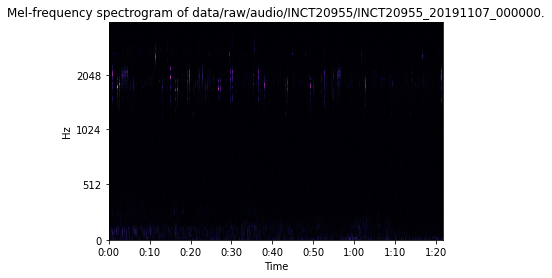

7424    1.911521
7425    1.760592
7426    1.427258
7427    1.093925
7428    1.237445
7429    1.719317
7430    2.000000
7431    1.762555
7432    1.280683
7433    1.922215
7434    1.847586
7435    1.462685
7436    1.077785
7437    2.000000
7438    2.000000
7439    1.714565
7440    2.000000
7441    1.479786
7442    1.783350
7443    1.139190
7444    2.000000
7445    2.000000
7446    1.667696
7447    2.000000
7448    2.000000
7449    2.332304
7450    2.995434
7451    2.589150
7452    1.182865
7453    2.000000
7454    2.000000
7455    2.000000
7456    2.000000
7457    2.113257
7458    3.000000
7459    3.000000
7460    2.745723
7461    0.525647
7462    1.192314
7463    1.000000
7464    1.000000
7465    0.000000
7466    0.000000
7467    0.000000
7468    0.000000
7469    0.000000
7470    0.000000
7471    0.000000
7472    0.000000
7473    0.000000
7474    0.000000
7475    0.000000
7476    0.000000
7477    0.000000
7478    0.000000
7479    0.000000
7480    0.000000
7481    0.000000
dtype: float64

,sample_name,fname,min_t,max_t,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,RHIICT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
7424,SAMPLE_07424.wav,INCT20955_20191107_000000,0,3,1.000000,0.911521,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7425,SAMPLE_07425.wav,INCT20955_20191107_000000,1,4,1.000000,0.760592,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7426,SAMPLE_07426.wav,INCT20955_20191107_000000,2,5,1.000000,0.427258,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7427,SAMPLE_07427.wav,INCT20955_20191107_000000,3,6,1.000000,0.093925,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7428,SAMPLE_07428.wav,INCT20955_20191107_000000,4,7,1.000000,0.237445,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7429,SAMPLE_07429.wav,INCT20955_20191107_000000,5,8,1.000000,0.719317,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7430,SAMPLE_07430.wav,INCT20955_20191107_000000,6,9,1.000000,1.000000,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7431,SAMPLE_07431.wav,INCT20955_20191107_000000,7,10,1.000000,0.762555,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7432,SAMPLE_07432.wav,INCT20955_20191107_000000,8,11,1.000000,0.280683,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7433,SAMPLE_07433.wav,INCT20955_20191107_000000,9,12,1.000000,0.922215,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


data/raw/audio/INCT20955/INCT20955_20191107_010000.wav


/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Reached EOF prematurely; finished at 2424832 bytes, expected 5293636 bytes from header.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


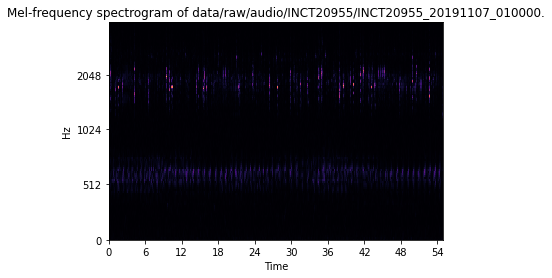

7482    4.000000
7483    3.921275
7484    3.000000
7485    3.000000
7486    3.000000
7487    3.296020
7488    3.690929
7489    4.000000
7490    3.703980
7491    3.309071
7492    3.000000
7493    3.461742
7494    4.000000
7495    4.000000
7496    3.538258
7497    3.906620
7498    4.000000
7499    3.903982
7500    3.093380
7501    3.000000
7502    3.000000
7503    3.000000
7504    3.081773
7505    4.000000
7506    4.000000
7507    3.404849
7508    1.486622
7509    0.486622
7510    0.000000
7511    0.000000
7512    0.000000
7513    0.000000
7514    0.000000
7515    0.000000
7516    0.000000
7517    0.000000
7518    0.000000
7519    0.000000
7520    0.000000
7521    0.000000
7522    0.000000
7523    0.000000
7524    0.000000
7525    0.000000
7526    0.000000
7527    0.000000
7528    0.000000
7529    0.000000
7530    0.000000
7531    0.000000
7532    0.000000
7533    0.000000
7534    0.000000
7535    0.000000
7536    0.000000
7537    0.000000
7538    0.000000
7539    0.000000
dtype: float64

,sample_name,fname,min_t,max_t,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,RHIICT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
7482,SAMPLE_07482.wav,INCT20955_20191107_010000,0,3,1.000000,1.000000,0.0,0.0,1.000000,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7483,SAMPLE_07483.wav,INCT20955_20191107_010000,1,4,1.000000,1.000000,0.0,0.0,0.921275,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7484,SAMPLE_07484.wav,INCT20955_20191107_010000,2,5,1.000000,1.000000,0.0,0.0,0.000000,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7485,SAMPLE_07485.wav,INCT20955_20191107_010000,3,6,1.000000,1.000000,0.0,0.0,0.000000,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7486,SAMPLE_07486.wav,INCT20955_20191107_010000,4,7,1.000000,1.000000,0.0,0.0,0.000000,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7487,SAMPLE_07487.wav,INCT20955_20191107_010000,5,8,1.000000,1.000000,0.0,0.0,0.296020,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7488,SAMPLE_07488.wav,INCT20955_20191107_010000,6,9,1.000000,1.000000,0.0,0.0,0.690929,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7489,SAMPLE_07489.wav,INCT20955_20191107_010000,7,10,1.000000,1.000000,0.0,0.0,1.000000,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7490,SAMPLE_07490.wav,INCT20955_20191107_010000,8,11,1.000000,1.000000,0.0,0.0,0.703980,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7491,SAMPLE_07491.wav,INCT20955_20191107_010000,9,12,1.000000,1.000000,0.0,0.0,0.309071,1.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


data/raw/audio/INCT20955/INCT20955_20191111_174500.wav


/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Reached EOF prematurely; finished at 4456448 bytes, expected 5293636 bytes from header.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


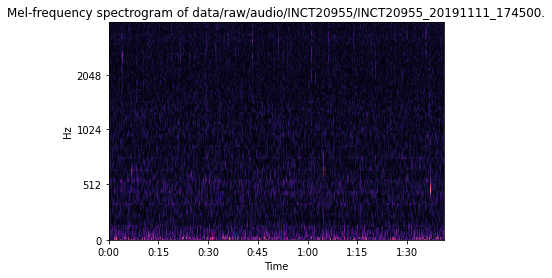

8526    0.0
8527    0.0
8528    0.0
8529    0.0
8530    0.0
8531    0.0
8532    0.0
8533    0.0
8534    0.0
8535    0.0
8536    0.0
8537    0.0
8538    0.0
8539    0.0
8540    0.0
8541    0.0
8542    0.0
8543    0.0
8544    0.0
8545    0.0
8546    0.0
8547    0.0
8548    0.0
8549    0.0
8550    0.0
8551    0.0
8552    0.0
8553    0.0
8554    0.0
8555    0.0
8556    0.0
8557    0.0
8558    0.0
8559    0.0
8560    0.0
8561    0.0
8562    0.0
8563    0.0
8564    0.0
8565    0.0
8566    0.0
8567    0.0
8568    0.0
8569    0.0
8570    0.0
8571    0.0
8572    0.0
8573    0.0
8574    0.0
8575    0.0
8576    0.0
8577    0.0
8578    0.0
8579    0.0
8580    0.0
8581    0.0
8582    0.0
8583    0.0
dtype: float64


,sample_name,fname,min_t,max_t,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,RHIICT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
8526,SAMPLE_08526.wav,INCT20955_20191111_174500,0,3,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8527,SAMPLE_08527.wav,INCT20955_20191111_174500,1,4,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8528,SAMPLE_08528.wav,INCT20955_20191111_174500,2,5,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8529,SAMPLE_08529.wav,INCT20955_20191111_174500,3,6,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8530,SAMPLE_08530.wav,INCT20955_20191111_174500,4,7,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8531,SAMPLE_08531.wav,INCT20955_20191111_174500,5,8,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8532,SAMPLE_08532.wav,INCT20955_20191111_174500,6,9,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8533,SAMPLE_08533.wav,INCT20955_20191111_174500,7,10,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8534,SAMPLE_08534.wav,INCT20955_20191111_174500,8,11,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8535,SAMPLE_08535.wav,INCT20955_20191111_174500,9,12,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


data/raw/audio/INCT20955/INCT20955_20191111_181500.wav


/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Reached EOF prematurely; finished at 3670016 bytes, expected 5293636 bytes from header.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


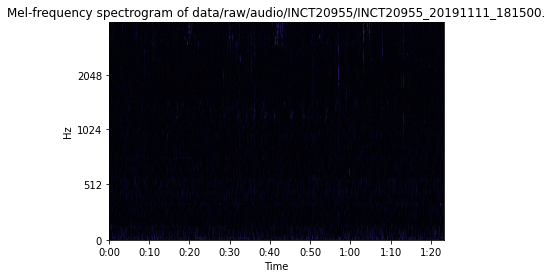

8584    1.000000
8585    0.869313
8586    1.000000
8587    1.000000
8588    0.799799
8589    1.000000
8590    0.196282
8591    1.000000
8592    1.000000
8593    0.985572
8594    1.000000
8595    1.000000
8596    1.000000
8597    1.000000
8598    1.000000
8599    0.048721
8600    0.382055
8601    0.715388
8602    1.000000
8603    1.000000
8604    1.000000
8605    1.000000
8606    1.000000
8607    1.000000
8608    1.000000
8609    1.000000
8610    0.811701
8611    0.478367
8612    0.145034
8613    1.000000
8614    1.000000
8615    0.000000
8616    0.000000
8617    0.000000
8618    0.000000
8619    0.000000
8620    0.000000
8621    0.000000
8622    0.000000
8623    0.000000
8624    0.000000
8625    0.000000
8626    0.000000
8627    0.000000
8628    0.000000
8629    0.000000
8630    0.000000
8631    0.000000
8632    0.000000
8633    0.000000
8634    0.000000
8635    0.000000
8636    0.000000
8637    0.000000
8638    0.000000
8639    0.000000
8640    0.000000
8641    0.000000
dtype: float64

,sample_name,fname,min_t,max_t,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,RHIICT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
8584,SAMPLE_08584.wav,INCT20955_20191111_181500,0,3,0.0,0.0,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8585,SAMPLE_08585.wav,INCT20955_20191111_181500,1,4,0.0,0.0,0.869313,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8586,SAMPLE_08586.wav,INCT20955_20191111_181500,2,5,0.0,0.0,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8587,SAMPLE_08587.wav,INCT20955_20191111_181500,3,6,0.0,0.0,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8588,SAMPLE_08588.wav,INCT20955_20191111_181500,4,7,0.0,0.0,0.799799,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8589,SAMPLE_08589.wav,INCT20955_20191111_181500,5,8,0.0,0.0,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8590,SAMPLE_08590.wav,INCT20955_20191111_181500,6,9,0.0,0.0,0.196282,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8591,SAMPLE_08591.wav,INCT20955_20191111_181500,7,10,0.0,0.0,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8592,SAMPLE_08592.wav,INCT20955_20191111_181500,8,11,0.0,0.0,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8593,SAMPLE_08593.wav,INCT20955_20191111_181500,9,12,0.0,0.0,0.985572,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


data/raw/audio/INCT20955/INCT20955_20191111_204500.wav


/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Reached EOF prematurely; finished at 3670016 bytes, expected 5293636 bytes from header.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


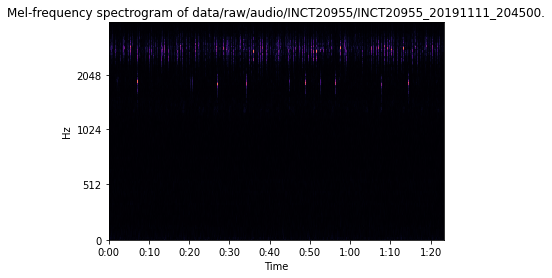

8758    4.000000
8759    3.819596
8760    3.039620
8761    3.372953
8762    2.706286
8763    3.000000
8764    3.154458
8765    3.638993
8766    4.000000
8767    3.845542
8768    3.361007
8769    4.000000
8770    4.000000
8771    4.000000
8772    3.397442
8773    3.754723
8774    3.421390
8775    2.690614
8776    3.000000
8777    3.000000
8778    3.000000
8779    3.000000
8780    3.000000
8781    2.653512
8782    3.264178
8783    3.345652
8784    3.277332
8785    4.000000
8786    4.000000
8787    3.000000
8788    3.000000
8789    3.659563
8790    4.000000
8791    3.727842
8792    2.734945
8793    3.061175
8794    3.868127
8795    4.000000
8796    4.000000
8797    3.495157
8798    2.495157
8799    0.495157
8800    0.000000
8801    0.000000
8802    0.000000
8803    0.000000
8804    0.000000
8805    0.000000
8806    0.000000
8807    0.000000
8808    0.000000
8809    0.000000
8810    0.000000
8811    0.000000
8812    0.000000
8813    0.000000
8814    0.000000
8815    0.000000
dtype: float64

,sample_name,fname,min_t,max_t,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,RHIICT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
8758,SAMPLE_08758.wav,INCT20955_20191111_204500,0,3,1.000000,1.000000,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8759,SAMPLE_08759.wav,INCT20955_20191111_204500,1,4,1.000000,0.819596,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8760,SAMPLE_08760.wav,INCT20955_20191111_204500,2,5,1.000000,1.000000,0.039620,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8761,SAMPLE_08761.wav,INCT20955_20191111_204500,3,6,1.000000,1.000000,0.372953,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8762,SAMPLE_08762.wav,INCT20955_20191111_204500,4,7,1.000000,0.000000,0.706286,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8763,SAMPLE_08763.wav,INCT20955_20191111_204500,5,8,1.000000,0.000000,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8764,SAMPLE_08764.wav,INCT20955_20191111_204500,6,9,1.000000,0.154458,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8765,SAMPLE_08765.wav,INCT20955_20191111_204500,7,10,1.000000,0.638993,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8766,SAMPLE_08766.wav,INCT20955_20191111_204500,8,11,1.000000,1.000000,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8767,SAMPLE_08767.wav,INCT20955_20191111_204500,9,12,1.000000,0.845542,1.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


data/raw/audio/INCT20955/INCT20955_20191123_040000.wav


/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/maad/sound/input_output.py:113: WavFileWarning: Reached EOF prematurely; finished at 2293760 bytes, expected 5293636 bytes from header.
  fs, s = wavfile.read(filename)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


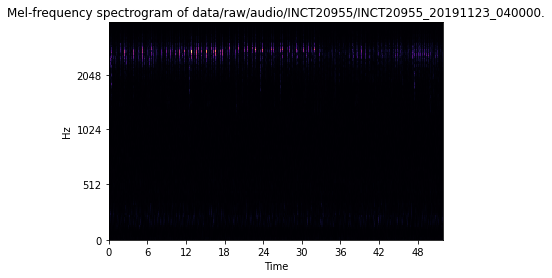

10208    2.972703
10209    2.643404
10210    2.718090
10211    3.000000
10212    4.000000
10213    4.000000
10214    3.688770
10215    2.355437
10216    2.022104
10217    2.000000
10218    2.000000
10219    2.000000
10220    2.000000
10221    2.488218
10222    3.000000
10223    3.000000
10224    2.511782
10225    4.000000
10226    4.000000
10227    4.000000
10228    2.000000
10229    2.862340
10230    3.000000
10231    3.000000
10232    1.471355
10233    1.390414
10234    0.000362
10235    0.000000
10236    0.000000
10237    0.000000
10238    0.000000
10239    0.000000
10240    0.000000
10241    0.000000
10242    0.000000
10243    0.000000
10244    0.000000
10245    0.000000
10246    0.000000
10247    0.000000
10248    0.000000
10249    0.000000
10250    0.000000
10251    0.000000
10252    0.000000
10253    0.000000
10254    0.000000
10255    0.000000
10256    0.000000
10257    0.000000
10258    0.000000
10259    0.000000
10260    0.000000
10261    0.000000
10262    0.000000
10263    0

,sample_name,fname,min_t,max_t,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,RHIICT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
10208,SAMPLE_10208.wav,INCT20955_20191123_040000,0,3,1.000000,0.000000,1.000000,0.0,0.972703,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10209,SAMPLE_10209.wav,INCT20955_20191123_040000,1,4,1.000000,0.000000,0.643404,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10210,SAMPLE_10210.wav,INCT20955_20191123_040000,2,5,1.000000,0.000000,0.718090,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10211,SAMPLE_10211.wav,INCT20955_20191123_040000,3,6,1.000000,0.000000,1.000000,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10212,SAMPLE_10212.wav,INCT20955_20191123_040000,4,7,1.000000,1.000000,1.000000,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10213,SAMPLE_10213.wav,INCT20955_20191123_040000,5,8,1.000000,1.000000,1.000000,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10214,SAMPLE_10214.wav,INCT20955_20191123_040000,6,9,1.000000,1.000000,0.688770,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10215,SAMPLE_10215.wav,INCT20955_20191123_040000,7,10,1.000000,0.000000,0.355437,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10216,SAMPLE_10216.wav,INCT20955_20191123_040000,8,11,1.000000,0.000000,0.022104,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10217,SAMPLE_10217.wav,INCT20955_20191123_040000,9,12,1.000000,0.000000,0.000000,0.0,1.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
/anaconda/envs/trans_env/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying a

In [ ]:
for dir_file in filename_errors:
    fname = recordings_folder+dir_file+'.wav'
    print(fname)
    file_name = plot_listen_examples(fname)
    example = df_anuraset_metadata[df_anuraset_metadata['fname']==dir_file]
    print(example[example.columns[4:]].sum(axis=1))
    display(example)
    

In [ ]:
df_anuraset_metadata.shape

(93496, 46)

In [ ]:
df_anuraset_metadata =  df_anuraset_metadata[~df_anuraset_metadata['sample_name'].isin(df_errors['sample_name'].unique())].reset_index(drop=True)
df_anuraset_metadata.shape

(93378, 46)

In [ ]:
df_anuraset_metadata.head()

,sample_name,fname,min_t,max_t,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,RHIICT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_anuraset_metadata = df_anuraset_metadata.drop(columns=['sample_name'])
prefix = 'SAMPLE_'
dataset_size = df_anuraset_metadata.shape[0]
exponent_of_10 = int(np.ceil(np.log10(dataset_size)))
sample_names = prefix + df_anuraset_metadata.index.astype(str).str.zfill(exponent_of_10)  + '.wav'
df_anuraset_metadata = df_anuraset_metadata.reset_index(drop=True)
df_anuraset_metadata.insert(loc=0,column='sample_name',value=sample_names)
df_anuraset_metadata.insert(loc=4,column='site',value=df_anuraset_metadata['fname'].str.split('_',1, expand=True)[0])

In [ ]:
df_anuraset_metadata.head()

,sample_name,fname,min_t,max_t,site,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# check 

#https://github.com/trent-b/iterative-stratification
#http://scikit.ml/api/skmultilearn.model_selection.iterative_stratification.html
#http://scikit.ml/stratification.html


#from skmultilearn.model_selection import iterative_train_test_split

#X_train, y_train, X_test, y_test = iterative_train_test_split(X, y, test_size = 0.3)


#from sklearn.model_selection import train_test_split

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)


"""
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
import numpy as np

X = np.array([[1,2], [3,4], [1,2], [3,4], [1,2], [3,4], [1,2], [3,4]])
y = np.array([[0,0], [0,0], [0,1], [0,1], [1,1], [1,1], [1,0], [1,0]])

mskf = MultilabelStratifiedKFold(n_splits=2, shuffle=True, random_state=0)

for train_index, test_index in mskf.split(X, y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
"""

    


'\nfrom iterstrat.ml_stratifiers import MultilabelStratifiedKFold\nimport numpy as np\n\nX = np.array([[1,2], [3,4], [1,2], [3,4], [1,2], [3,4], [1,2], [3,4]])\ny = np.array([[0,0], [0,0], [0,1], [0,1], [1,1], [1,1], [1,0], [1,0]])\n\nmskf = MultilabelStratifiedKFold(n_splits=2, shuffle=True, random_state=0)\n\nfor train_index, test_index in mskf.split(X, y):\n    print("TRAIN:", train_index, "TEST:", test_index)\n    X_train, X_test = X[train_index], X[test_index]\n    y_train, y_test = y[train_index], y[test_index]\n'

In [ ]:
df_anuraset_metadata.head()

,sample_name,fname,min_t,max_t,site,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
anura_reload = []
for site in df_anuraset_metadata['site'].unique():
    print('site:', site)
    df_fname = df_anuraset_metadata[df_anuraset_metadata['site']==site]
    df_fname = df_fname.groupby(['fname'])[df_anuraset_metadata.columns[5:]].agg(lambda x: 1 if sum(x)>0 else 0).reset_index()
    print(df_fname.melt('fname').groupby(['variable'])['value'].sum().sort_values())
    X = df_fname[df_fname.columns[1:]].to_numpy()
    y = df_fname[df_fname.columns[1:]].to_numpy()

    from skmultilearn.model_selection import IterativeStratification

    k_fold = IterativeStratification(n_splits=3, order=1)
    for train, test in k_fold.split(X, y):
        break
    
    
    df_fname.insert(loc=5,column='subset',
                    value=['train' if i in train  else 'test'  for i in range(len(X))])
    df_fname = df_fname[['fname', 'subset']]
    
    
    df_anuraset_sit_splitted = pd.merge(df_anuraset_metadata[df_anuraset_metadata['site']==site], df_fname, on='fname', how='left')
    print('Leakage:', detect_group_leakage(df_anuraset_sit_splitted, 'fname', 'subset'))
    anura_reload.append(df_anuraset_sit_splitted)

site: INCT20955
variable
ADEDIP      0
LEPLAB      0
LEPNOT      0
LEPPOD      0
PHYALB      0
PHYDIS      0
PHYMAR      0
PHYNAT      0
PHYSAU      0
PITAZU      0
RHIORN      0
RHISCI      0
SCIALT      0
SCIFUS      0
SCIFUV      0
SCINAS      0
SCIRIZ      0
LEPFLA      0
LEPFUS      0
ELAMAT      0
ADEMAR      0
AMEPIC      0
BOAALB      0
BOAALM      0
LEPELE      0
BOARAN      0
DENCRU      0
BOALUN      0
DENELE      0
DENNAN      0
RHIICT     19
DENNAH     27
DENMIN     36
BOAPRA     37
ELABIC     42
BOALEP     47
PHYCUV     77
BOAFAB    106
SCIPER    135
LEPLAT    175
BOABIS    361
SPHSUR    386
Name: value, dtype: int64
Leakage: False
site: INCT41
variable
ADEDIP      0
LEPLAB      0
LEPLAT      0
LEPNOT      0
LEPPOD      0
PHYALB      0
PHYDIS      0
PHYNAT      0
SCIRIZ      0
PHYSAU      0
RHIORN      0
RHISCI      0
SCIALT      0
SCIFUS      0
SCIFUV      0
SCINAS      0
SCIPER      0
RHIICT      0
LEPFLA      0
LEPFUS      0
ELAMAT      0
ADEMAR      0
AMEPIC      0
BO

In [ ]:
df_fname

,fname,subset
0,INCT4_20191005_173000,train
1,INCT4_20191023_001500,test
2,INCT4_20191023_003000,test
3,INCT4_20191023_011500,test
4,INCT4_20191023_013000,test
...,...,...
415,INCT4_20210104_221500,train
416,INCT4_20210104_231500,test
417,INCT4_20210105_001500,train
418,INCT4_20210105_011500,train


In [ ]:
df_anuraset_metadata_reload = pd.concat(anura_reload, ignore_index=True)

In [ ]:
df_anuraset_metadata_reload.shape

(93378, 48)

In [ ]:
df_anuraset_metadata_reload.head()

,sample_name,fname,min_t,max_t,site,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,...,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT,subset
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,test
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,test
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,test
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,test
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,INCT20955,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,test


In [ ]:
df_anuraset_metadata_reload.tail()

,sample_name,fname,min_t,max_t,site,SPHSUR,BOABIS,SCIPER,DENNAH,LEPLAT,...,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT,subset
93373,SAMPLE_93373.wav,INCT4_20210105_021500,53,56,INCT4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,train
93374,SAMPLE_93374.wav,INCT4_20210105_021500,54,57,INCT4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,train
93375,SAMPLE_93375.wav,INCT4_20210105_021500,55,58,INCT4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,train
93376,SAMPLE_93376.wav,INCT4_20210105_021500,56,59,INCT4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,train
93377,SAMPLE_93377.wav,INCT4_20210105_021500,57,60,INCT4,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,train


In [ ]:
df_anuraset_metadata_reload.to_csv('data/datasets/anurasetv3/metadata.csv', index=False)

In [ ]:
df_anuraset_metadata_reload.shape

(93378, 48)

In [ ]:
result = Parallel(n_jobs=5)(delayed(preprocessing_audio)(row[0],row[1], row[2], row[3]) 
                  for row in tqdm(df_anuraset_metadata_reload[['sample_name','fname', 'min_t', 'max_t']].to_numpy()))

100%|██████████| 93378/93378 [47:56<00:00, 32.46it/s]  


Folder created: data/datasets/dataset_


# YO ME IDENTIFICO COMO TAL:

In [4]:
df_anuraset_metadata.head()

,sample_name,fname,min_t,max_t,site,date,species_number,subset,SPHSUR,BOABIS,...,SCINAS,LEPNOT,ADEMAR,BOAALM,PHYDIS,RHIORN,LEPFLA,SCIRIZ,DENELE,SCIALT
0,SAMPLE_00000.wav,INCT20955_20190904_003000,0,3,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
1,SAMPLE_00001.wav,INCT20955_20190904_003000,1,4,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
2,SAMPLE_00002.wav,INCT20955_20190904_003000,2,5,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
3,SAMPLE_00003.wav,INCT20955_20190904_003000,3,6,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0
4,SAMPLE_00004.wav,INCT20955_20190904_003000,4,7,INCT20955,2019-09-04 00:30:00,4,test,1,1,...,0,0,0,0,0,0,0,0,0,0


In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("notebook")
plt.rcParams["figure.figsize"] = (19,7)

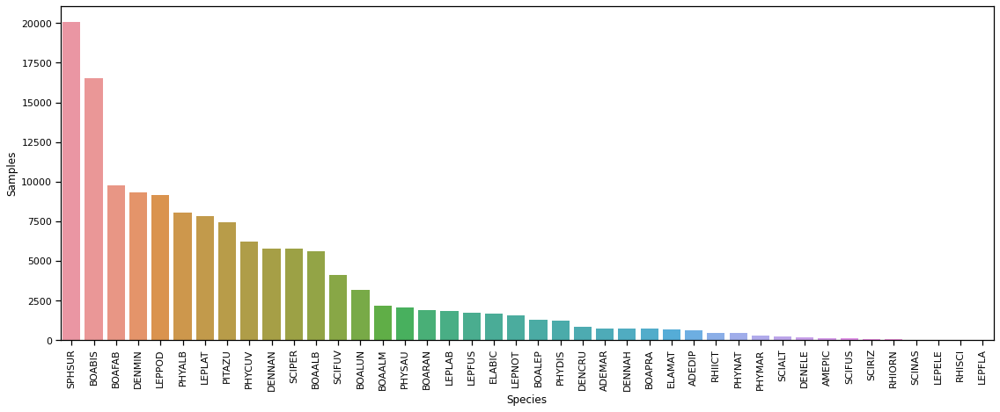

In [6]:
df_count = df_anuraset_metadata.iloc[:,8:].sum().to_frame().reset_index().sort_values(by=[0],ascending=False)
df_count.columns = ['Species','Samples']

sns.barplot(data=df_count, x="Species", y="Samples")
plt.xticks(rotation=90)
plt.show()

In [7]:
sorter = list(df_count['Species'])

df_train_tests = df_anuraset_metadata.copy()
df_train_tests = df_train_tests[['subset']+list(df_train_tests.columns[8:])].melt(id_vars=["subset"], 
                                                                                    var_name="Species", 
                                                                                    value_name="Samples")

df_train_tests = df_train_tests.groupby(['subset','Species'])['Samples'].sum().to_frame().reset_index().sort_values(by=['Samples'],ascending=False)
df_train_tests['Species'] = pd.Categorical(df_train_tests.Species, ordered=True, categories=sorter)
df_train_tests = df_train_tests.sort_values('Species')

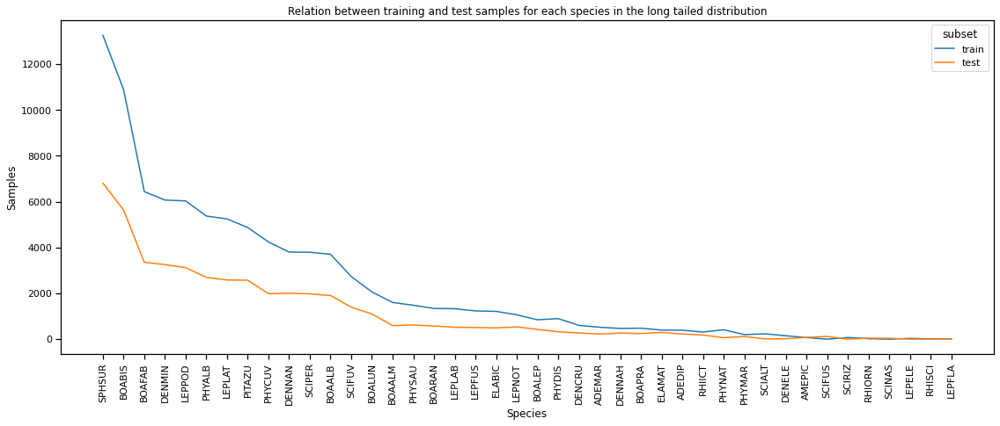

In [8]:
sns.lineplot(data=df_train_tests, x="Species", y="Samples", hue="subset")
plt.xticks(rotation=90)
plt.title('Relation between training and test samples for each species in the long tailed distribution')
plt.show()

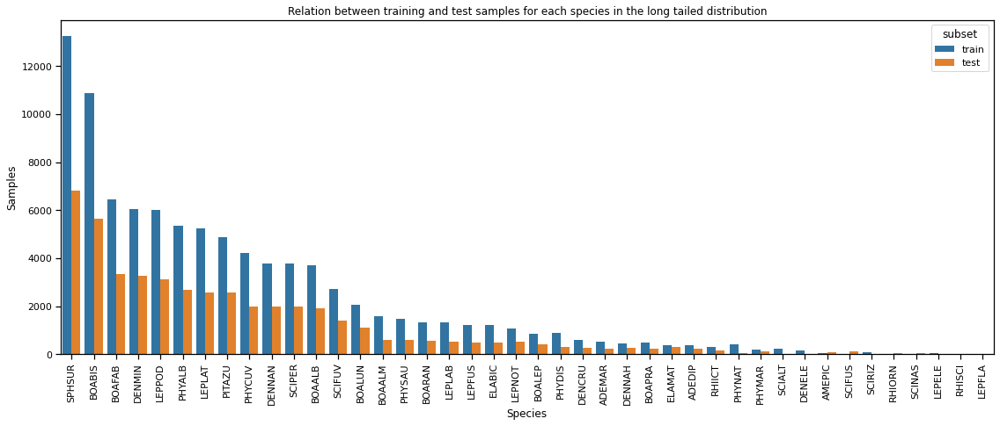

In [9]:
sns.barplot(data=df_train_tests, x="Species", y="Samples", hue="subset")
plt.xticks(rotation=90)
plt.title('Relation between training and test samples for each species in the long tailed distribution')
plt.show()

In [10]:
import seaborn.objects as so

/anaconda/envs/trans_env/lib/python3.8/_collections_abc.py:832: MatplotlibDeprecationWarning: 
The savefig.jpeg_quality rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]
/anaconda/envs/trans_env/lib/python3.8/_collections_abc.py:832: MatplotlibDeprecationWarning: 
The savefig.jpeg_quality rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  self[key] = other[key]


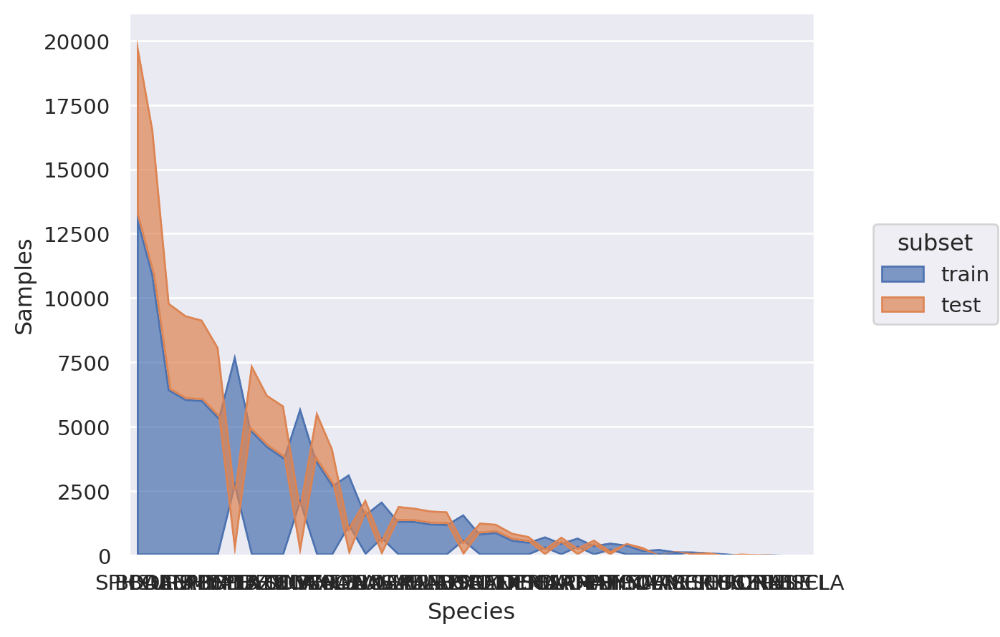

Bad pipe message: %s [b'\xe9\x1c\x15H\xd3.I\xe7\xd0\xcd\x02\r\xd3\x074\x14x\xaa ,\x02\xa2\\_\x9cw\xce\xfb\x06\xe1I\n/?\xfd\xack5\xb7\xb82F\xb0{\xaa\xda\x13\xa9\xff`\xb1\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08', b'\x08\n\x08\x0b\x08\x04\x08', b'\x06\x04\x01\x05']
Bad pipe message: %s [b'']
Bad pipe message: %s [b"\xce,\xfc\xc3\x9d\x8b\xc4d[\xb5\x88R\x0e\xac\x01\xa4]h\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q"]
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x12,\x9b\xba

In [13]:
(
    so.Plot(df_train_tests, "Species", "Samples", color="subset")
    .add(so.Area(alpha=.7), so.Stack())
)


In [ ]:
# how many fname are per species?
df_anuraset_metadata

In [ ]:
df_anuraset_metadata.groupby(['fname'])[dk.columns[4:-1]].sum()

In [ ]:
df_anuraset_metadata.head()

In [ ]:
df_fname.head()

In [ ]:
 path_save_audio = join(path_save, 'audio')
 
    if not exists(path_save_audio):
        makedirs(path_save_audio)
        print('Folder created:', path_save_audio)
        
    readme_generator(df_dataset_cv,name=path_save,sr=target_sr,wl=wl,flims=flims)
      
    for site in site_list:
        
        print('Saving files for site:',site)
        wav_path = 'data/raw/site_name/recordings/'
        wav_path = wav_path.replace('site_name',site)
    
        batch_write_samples(df_dataset_cv[df_dataset_cv['site']==site], 
                        wav_path=wav_path, 
                        target_sr=target_sr,
                        path_save=path_save_audio,
                        flims=flims, 
                        verbose=True)
    print('Last checking')
    samples_len = len([f for f in listdir(path_save_audio) if isfile(join(path_save_audio, f))])
    df_len = df_dataset_cv.shape[0]

    if samples_len==df_len:
        df_dataset_cv.to_csv(path_save+'/df_train_test_files.csv', index=False)
        print("Datased created in:", path_save) 
        # TODO: save parameters   
                
        make_archive(path_save,
                    'zip',
                    path_save.rsplit('/',1)[0],
                    path_save.split('/')[-1])
        return df_dataset_cv   
    else:
        warn("Different size between recordings extracted and samples!!")
        print('dataset samples:',df_len)
        print('audio samples:',samples_len)
        return df_dataset_cv 

In [ ]:
def detect_group_leakage(df, group_name, split_name):
    
    df_overlapping = df.groupby([group_name])[split_name].nunique()
    return any(df_overlapping>1)

def plot_split_size(df, split_name, labels_names):
    
    df_plot = df.groupby([split_name])[labels_names].sum()
    display(round(df_plot/df_plot.sum(),2))

In [ ]:
# Multiclass
wl = 3
sr = 22050
flims = (1,10000)
site_list = ['INCT20955','INCT41']
path_save = 'data/BuildDataset/datasetv2-multiclass_1'
labels_cols = ['BOAFAB_F', 'BOAFAB_M', 'PHYCUV_F', 'PHYCUV_M', 'BOAFAB_C', 'DENCRU_M',
               'BOALUN_M', 'BOAALB_M', 'BOAALB_F', 'DENCRU_F', 'BOALUN_F', 'PHYMAR_F',
               'PHYMAR_M', 'PITAZU_M', 'PITAZU_F', 'BOALUN_C', 'PHYMAR_C']
start = time.time()
df_multiclass = build_dataset(wl=wl, 
                              site_list=site_list,
                              target_sr=sr, 
                              flims=flims,
                              path_save=path_save,
                             labels_cols=labels_cols)
end = time.time()
print(round((end - start)/60,1),' minutes')

In [ ]:
df_dataset_concat = df_multiclass.copy()

In [ ]:
df_dataset_concat.shape

In [ ]:
df_dataset_concat['fold'].value_counts(normalize=True)

In [ ]:
pd.crosstab(df_dataset_concat['subset'], df_dataset_concat['fold'])

In [ ]:
print('Group Leakage:', detect_group_leakage(df=df_dataset_concat, 
                 group_name='fname',
                 split_name='fold'))

In [ ]:
df_dataset_concat_D = df_dataset_concat.copy()
df_dataset_concat_D['dummy'] = 1
df_dataset_concat_D = df_dataset_concat_D.pivot_table(index='class', columns = 'fold', values = 'dummy',aggfunc=np.sum)
df_dataset_concat_D = pd.concat([df_dataset_concat_D,
                                df_dataset_concat['class'].value_counts().rename('Label count')],axis=1,)
df_dataset_concat_D= pd.concat([df_dataset_concat_D,
                                pd.DataFrame(df_dataset_concat['fold'].value_counts(normalize=False).rename('Fold count')).T])
df_dataset_concat_D

In [ ]:
df_dataset_concat['class'].value_counts()

In [ ]:
df_dataset_concat.head()

In [ ]:
# Binary BOAFAB
wl = 3
sr = 22050
flims = (100,2000)
verbose = False # Doubt about use this term
recordings_folder = 'data/INCT20955/raw/recordings/'
annotation_path = 'data/INCT20955/raw/annotations/'
path_save = 'data/datasetv1/binary_boafab_1'
prefix='SAMPLE_'
labels_cols = ['BOAFAB_M','BOAFAB_C'] # looks like multiclass but ends like binary
site=['INCT20955']

start = time.time()
df_boafab_binary_dataset = build_dataset(wav_path=recordings_folder, 
                                                  annotation_path=annotation_path, 
                                                  wl=wl, 
                                                  site=site,
                                                  target_sr=sr, 
                                                  flims=flims,
                                                  path_save=path_save, 
                                                  prefix=prefix, 
                                                  labels_cols=labels_cols,
                                                  verbose=verbose)
end = time.time()
print(round((end - start)/60,1),' minutes')

In [ ]:
# Binary PHYCUV
wl = 3
sr = 22050
flims = (300,2000)
verbose=True
recordings_folder = 'data/INCT20955/raw/recordings/'
annotation_path = 'data/INCT20955/raw/annotations/'
path_save='data/datasetv1/binary_phycuv_1'
prefix='SAMPLE_'
labels_cols = ['PHYCUV_M']
site=['INCT20955']

start = time.time()
df_phycuv_binary_dataset = build_dataset(wav_path=recordings_folder, 
                                                  annotation_path=annotation_path, 
                                                  wl=wl, 
                                                  site=site,
                                                  target_sr=sr, 
                                                  flims=flims,
                                                  path_save=path_save, 
                                                  prefix=prefix, 
                                                  labels_cols=labels_cols,
                                                  verbose=verbose)
end = time.time()
print(round((end - start)/60,1),' minutes')

In [ ]:
# Multiclass
wl = 3
sr = 22050
flims = (1,10000)
verbose = False # Doubt about use this term
recordings_folder = 'data/INCT41/raw/recordings/'
annotation_path = 'data/INCT41/raw/annotations/'
path_save='data/datasetv2/multiclass_1'
prefix='SAMPLE_'
max_duration = 60
labels_cols = ['BOAFAB_M','BOAFAB_C','PHYCUV_M']
site=['INCT20955','INCT4']

start = time.time()
df_boafab_multiclass_1 = build_dataset(wav_path=recordings_folder, 
                                                  annotation_path=annotation_path, 
                                                  wl=wl, 
                                                  site=site,
                                                  target_sr=sr, 
                                                  flims=flims,
                                                  path_save=path_save, 
                                                  prefix=prefix, 
                                                  labels_cols=labels_cols,
                                                  verbose=verbose)
end = time.time()
print(round((end - start)/60,1),' minutes')